# **Part 3**
# **Extension**
On this basis, we made three extensions. 

First, we compared the output result of Faster R-CNN with Mask R-CNN by using the same image. On the Faster R-CNN case, we could see the output of labels、 scores and boxes. While on the Mask R-CNN case, additional ‘mask’ output is displayed.

In [ ]:
import os
from os.path import exists, join, basename, splitext

git_repo_url = 'https://github.com/facebookresearch/Detectron.git'
project_name = splitext(basename(git_repo_url))[0]
if not exists(project_name):
  # clone
  !git clone -q --depth 1 $git_repo_url
  # dependencies
  !cd $project_name && pip install -q -r requirements.txt
  # build
  !cd $project_name && make
# test Detectron
!python $project_name/detectron/tests/test_spatial_narrow_as_op.py 

import sys
sys.path.append(project_name)
import time
import matplotlib
import matplotlib.pylab as plt
plt.rcParams["axes.grid"] = False

from IPython.display import clear_output

In [ ]:
code_url= 'https://github.com/LCMmmmmmm/ML-Maskrcnn/raw/main/vis.py'
code_dir='Detectron/detectron/utils/vis.py'
!wget -q -O $code_dir $code_url

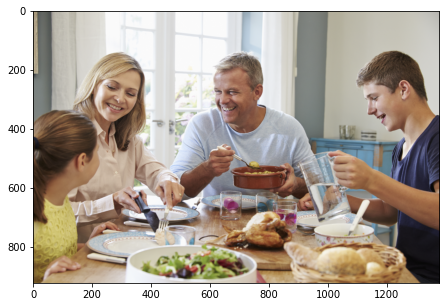

In [ ]:
#IMAGE_URL = 'https://raw.githubusercontent.com/tugstugi/dl-colab-notebooks/master/resources/traffic_camera.jpg'
IMAGE_URL='https://github.com/LCMmmmmmm/ML-Maskrcnn/raw/main/dinner.png' #分辨率不要太高图片不要太大
image_file = basename(IMAGE_URL)
image_file_ext = splitext(image_file)[1][1:]
images_dir = 'images'
!mkdir -p $images_dir && rm -rf $images_dir/*
!wget -q -O $images_dir/$image_file $IMAGE_URL

plt.figure(figsize=(10, 5))
plt.imshow(matplotlib.image.imread(join(images_dir, image_file)))

In [ ]:
MODEL_CFG ='e2e_faster_rcnn_X-101-64x4d-FPN_1x.yaml'
PRETRAINED_MODEL_URL =  'https://dl.fbaipublicfiles.com/detectron/35858015/12_2017_baselines/e2e_faster_rcnn_X-101-64x4d-FPN_1x.yaml.01_40_54.1xc565DE/output/train/coco_2014_train%3Acoco_2014_valminusminival/generalized_rcnn/model_final.pkl'

!cd $project_name && python tools/infer_simple.py \
    --cfg configs/12_2017_baselines/$MODEL_CFG \
    --wts $PRETRAINED_MODEL_URL \
    --thresh 0.7 \
    --output-dir ../output/faster/ --output-ext png --always-out \
    --image-ext $image_file_ext \
    ../$images_dir

In [ ]:
MODEL_CFG = 'e2e_mask_rcnn_X-101-64x4d-FPN_1x.yaml'
#MODEL_CFG ='e2e_faster_rcnn_X-101-64x4d-FPN_1x.yaml'
PRETRAINED_MODEL_URL = 'https://dl.fbaipublicfiles.com/detectron/36494496/12_2017_baselines/e2e_mask_rcnn_X-101-64x4d-FPN_1x.yaml.07_50_11.fkwVtEvg/output/train/coco_2014_train%3Acoco_2014_valminusminival/generalized_rcnn/model_final.pkl'
!cd $project_name && python tools/infer_simple.py \
    --cfg configs/12_2017_baselines/$MODEL_CFG \
    --wts $PRETRAINED_MODEL_URL \
    --thresh 0.7 \
    --output-dir ../output/mask/ --output-ext png --always-out \
    --image-ext $image_file_ext \
    ../$images_dir

In [ ]:

MODEL_CFG = 'e2e_keypoint_rcnn_X-101-64x4d-FPN_1x.yaml'
PRETRAINED_MODEL_URL = 'https://dl.fbaipublicfiles.com/detectron/37732355/12_2017_baselines/e2e_keypoint_rcnn_X-101-64x4d-FPN_1x.yaml.16_56_16.yv4t4W8N/output/train/keypoints_coco_2014_train%3Akeypoints_coco_2014_valminusminival/generalized_rcnn/model_final.pkl'
!cd $project_name && python tools/infer_simple.py \
    --cfg configs/12_2017_baselines/$MODEL_CFG \
    --wts $PRETRAINED_MODEL_URL \
    --thresh 0.7 \
    --output-dir ../output/kps/ --output-ext png --always-out \
    --image-ext $image_file_ext \
    ../$images_dir

In [ ]:
#from google.colab import drive
#drive.mount('/content/drive')

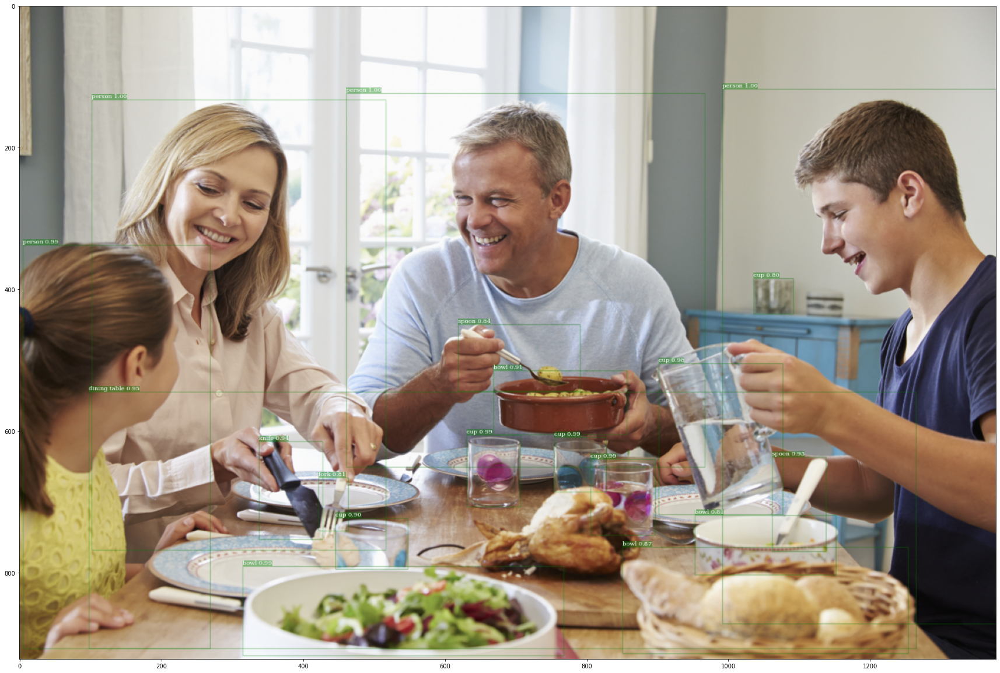

In [ ]:
plt.figure(figsize=(30, 30))
plt.imshow(matplotlib.image.imread('output/faster/%s.png' % image_file))

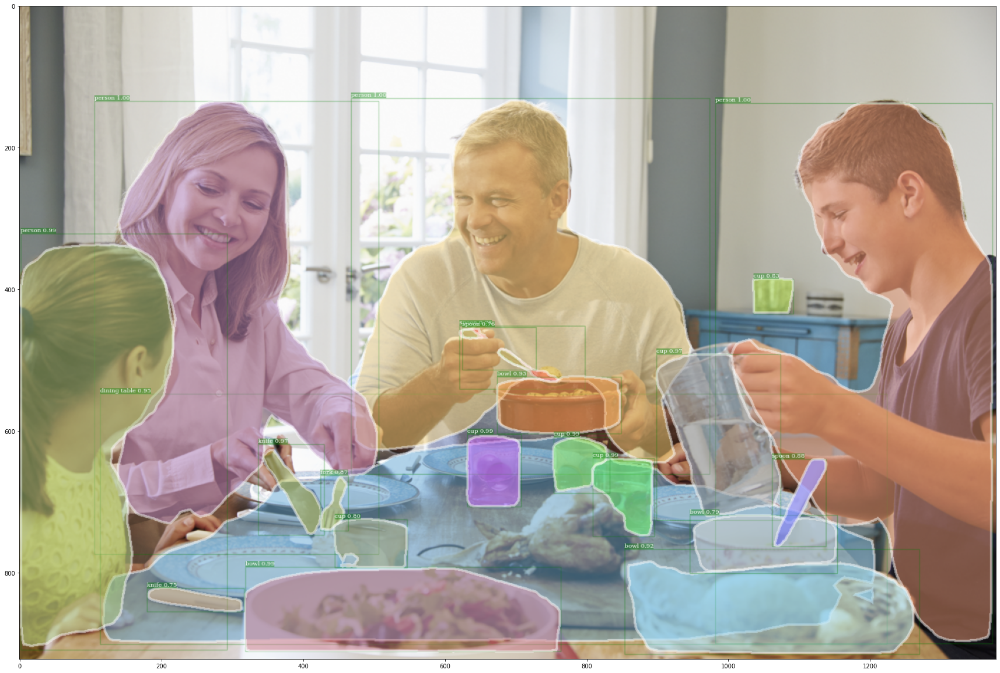

In [ ]:
plt.figure(figsize=(30, 30))
plt.imshow(matplotlib.image.imread('output/mask/%s.png' % image_file))

As mentioned before, Mask R-CNN performs better in terms of box accuracy, so we put these two output images together. As a result, we observed that the green box, which is Mask R-CNN, is obviously more accurate than the grey box, which is Faster R-CNN. This proves what we said before.

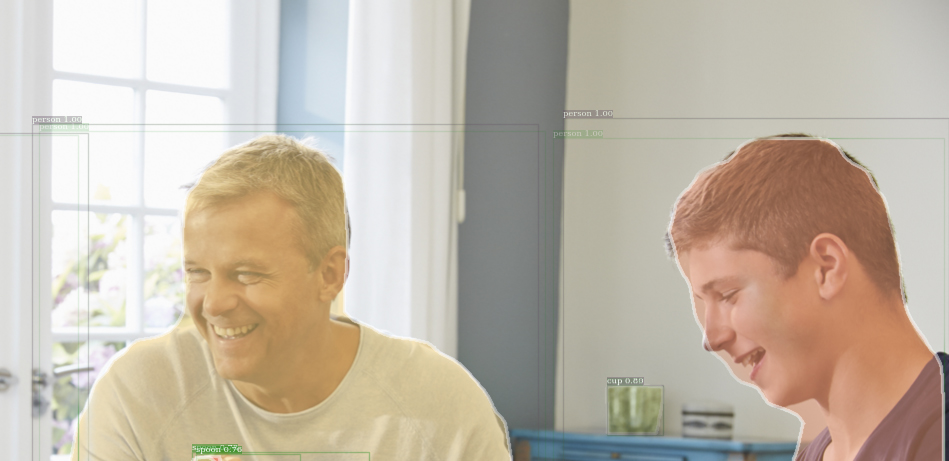



Second, in the paper, the author mentioned that Mask R-CNN could be used for Human Pose Estimation with keypoint detection, he models a keypoint’s location as a one-hot mask, and adopts Mask R-CNN to predict K masks, one for each K keypoint type. 

We also did this part by using detectron keypoint model. On the output image, we could see the person labels、 scores、boxes and keypoints shown.


Besides, we got these keypoints data from the source code. By using the data, we label some body parts: left-eye、right-eye、 nose, and also calculate the position of shoulder and hip. 

We rewrite the source code of this part in our github and cover the Detectron Mask R-CNN model in colab.

In [ ]:
"""
def vis_one_image(
        im, im_name, output_dir, boxes, segms=None, keypoints=None, thresh=0.9,
        kp_thresh=2, dpi=200, box_alpha=0.0, dataset=None, show_class=False,
        ext='pdf', out_when_no_box=False):

    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    if isinstance(boxes, list):
        boxes, segms, keypoints, classes = convert_from_cls_format(
            boxes, segms, keypoints)

    if (boxes is None or boxes.shape[0] == 0 or max(boxes[:, 4]) < thresh) and not out_when_no_box:
        return

    dataset_keypoints, _ = keypoint_utils.get_keypoints()

    if segms is not None and len(segms) > 0:
        masks = mask_util.decode(segms)

    color_list = colormap(rgb=True) / 255

    kp_lines = kp_connections(dataset_keypoints)
    cmap = plt.get_cmap('rainbow')
    colors = [cmap(i) for i in np.linspace(0, 1, len(kp_lines) + 2)]

    fig = plt.figure(frameon=False)
    fig.set_size_inches(im.shape[1] / dpi, im.shape[0] / dpi)
    ax = plt.Axes(fig, [0., 0., 1., 1.])
    ax.axis('off')
    fig.add_axes(ax)
    ax.imshow(im)

    if boxes is None:
        sorted_inds = [] # avoid crash when 'boxes' is None
    else:
        # Display in largest to smallest order to reduce occlusion
        areas = (boxes[:, 2] - boxes[:, 0]) * (boxes[:, 3] - boxes[:, 1])
        sorted_inds = np.argsort(-areas)

    mask_color_id = 0
    for i in sorted_inds:
        bbox = boxes[i, :4]
        score = boxes[i, -1]
        if score < thresh:
            continue

        # show box (off by default)
        ax.add_patch(
            plt.Rectangle((bbox[0], bbox[1]),
                          bbox[2] - bbox[0],
                          bbox[3] - bbox[1],
                          fill=False, edgecolor='g',
                          linewidth=0.5, alpha=box_alpha))

        if show_class:
            ax.text(
                bbox[0], bbox[1] - 2,
                get_class_string(classes[i], score, dataset),
                fontsize=3,
                family='serif',
                bbox=dict(
                    facecolor='g', alpha=0.4, pad=0, edgecolor='none'),
                color='white')

        # show mask
        if segms is not None and len(segms) > i:
            img = np.ones(im.shape)
            color_mask = color_list[mask_color_id % len(color_list), 0:3]
            mask_color_id += 1

            w_ratio = .4
            for c in range(3):
                color_mask[c] = color_mask[c] * (1 - w_ratio) + w_ratio
            for c in range(3):
                img[:, :, c] = color_mask[c]
            e = masks[:, :, i]

            contour = cv2.findContours(
                e.copy(), cv2.RETR_CCOMP, cv2.CHAIN_APPROX_NONE)[-2]

            for c in contour:
                polygon = Polygon(
                    c.reshape((-1, 2)),
                    fill=True, facecolor=color_mask,
                    edgecolor='w', linewidth=1.2,
                    alpha=0.5)
                ax.add_patch(polygon)

        # show keypoints
        if keypoints is not None and len(keypoints) > i:
            kps = keypoints[i]
            plt.autoscale(False)
            for l in range(len(kp_lines)):
                i1 = kp_lines[l][0]
                i2 = kp_lines[l][1]
       
                if kps[2, i1] > kp_thresh and kps[2, i2] > kp_thresh:
                    x = [kps[0, i1], kps[0, i2]]
                    y = [kps[1, i1], kps[1, i2]]
                    line = plt.plot(x, y)
                    plt.setp(line, color=colors[l], linewidth=1.0, alpha=0.7)
                if kps[2, i1] > kp_thresh:
                    plt.plot(
                        kps[0, i1], kps[1, i1], '.', color=colors[l],
                        markersize=3.0, alpha=0.7)

                if kps[2, i2] > kp_thresh:
                    plt.plot(
                        kps[0, i2], kps[1, i2], '.', color=colors[l],
                        markersize=3.0, alpha=0.7)

            # add mid shoulder / mid hip for better visualization
            mid_shoulder = (
                kps[:2, dataset_keypoints.index('right_shoulder')] +
                kps[:2, dataset_keypoints.index('left_shoulder')]) / 2.0
            sc_mid_shoulder = np.minimum(
                kps[2, dataset_keypoints.index('right_shoulder')],
                kps[2, dataset_keypoints.index('left_shoulder')])
            mid_hip = (
                kps[:2, dataset_keypoints.index('right_hip')] +
                kps[:2, dataset_keypoints.index('left_hip')]) / 2.0
            sc_mid_hip = np.minimum(
                kps[2, dataset_keypoints.index('right_hip')],
                kps[2, dataset_keypoints.index('left_hip')])
            ax.text(
                kps[0, dataset_keypoints.index('left_eye')], kps[1, dataset_keypoints.index('left_eye')],
                'left_eye',
                fontsize=3,
                family='serif',
                bbox=dict(
                    facecolor='g', alpha=0.4, pad=0, edgecolor='none'),
                color='white')                       
            ax.text(
                kps[0, dataset_keypoints.index('right_eye')], kps[1, dataset_keypoints.index('right_eye')],
                'right_eye',
                fontsize=3,
                family='serif',
                bbox=dict(
                    facecolor='g', alpha=0.4, pad=0, edgecolor='none'),
                color='white')   
            ax.text(
                kps[0, dataset_keypoints.index('nose')], kps[1, dataset_keypoints.index('nose')],
                'nose',
                fontsize=3,
                family='serif',
                bbox=dict(
                    facecolor='g', alpha=0.4, pad=0, edgecolor='none'),
                color='white')
            ax.text(
                mid_shoulder[0], mid_shoulder[1],
                'shoulder',
                fontsize=3,
                family='serif',
                bbox=dict(
                    facecolor='g', alpha=0.4, pad=0, edgecolor='none'),
                color='white')   
            ax.text(
                mid_hip[0], mid_hip[1],
                'hip',
                fontsize=3,
                family='serif',
                bbox=dict(
                    facecolor='g', alpha=0.4, pad=0, edgecolor='none'),
                color='white')            
            if (sc_mid_shoulder > kp_thresh and
                    kps[2, dataset_keypoints.index('nose')] > kp_thresh):
                x = [mid_shoulder[0], kps[0, dataset_keypoints.index('nose')]]
                y = [mid_shoulder[1], kps[1, dataset_keypoints.index('nose')]]
            
                line = plt.plot(x, y)
                plt.setp(
                    line, color=colors[len(kp_lines)], linewidth=1.0, alpha=0.7)
            if sc_mid_shoulder > kp_thresh and sc_mid_hip > kp_thresh:
                x = [mid_shoulder[0], mid_hip[0]]
                y = [mid_shoulder[1], mid_hip[1]]
                
                line = plt.plot(x, y)
                plt.setp(
                    line, color=colors[len(kp_lines) + 1], linewidth=1.0,
                    alpha=0.7)
"""


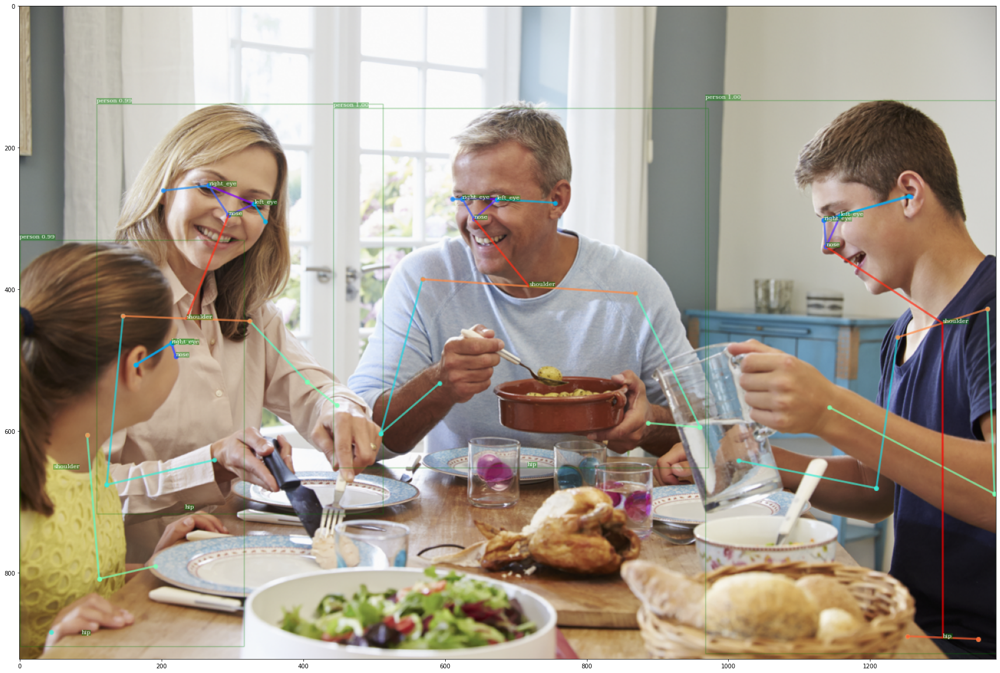

In [ ]:
plt.figure(figsize=(30, 30))
plt.imshow(matplotlib.image.imread('output/kps/%s.png' % image_file))

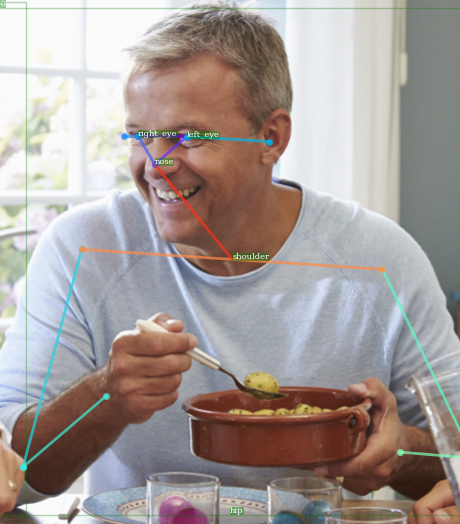

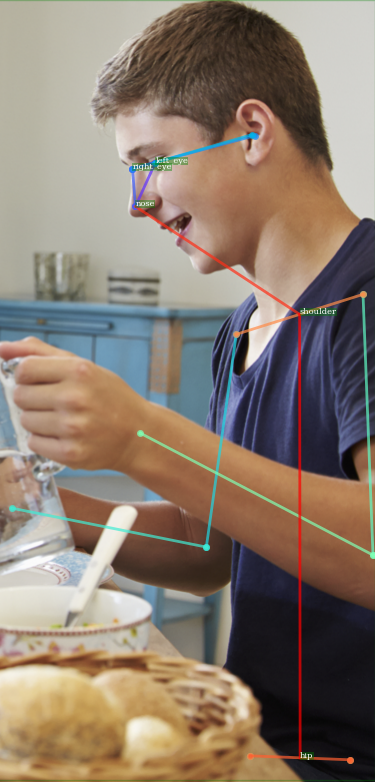

Finally, in the paper, the author compared different Backbone Architectures. 

Detectron provides us with these different models, and we focus on two comparisons : C4 and FPN, Resnet50、resnet101 and resnext101.  We compared the ap value of each model and got the expected result: deeper networks do better, FPN outperforms C4 features, and ResNeXt improves on ResNet.


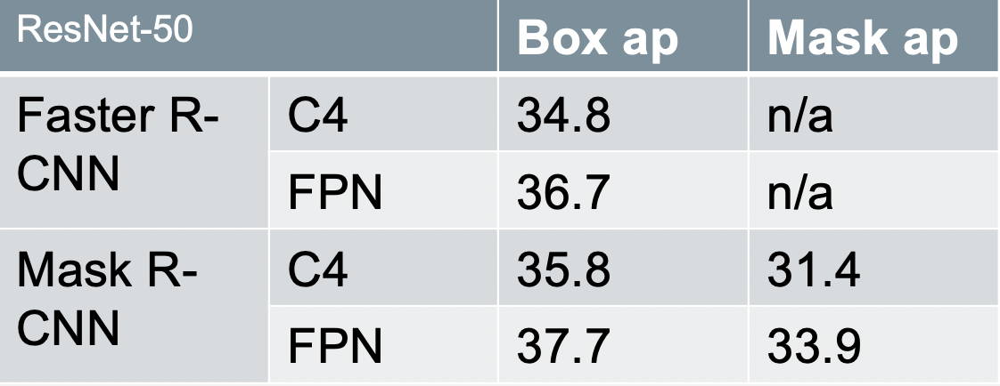

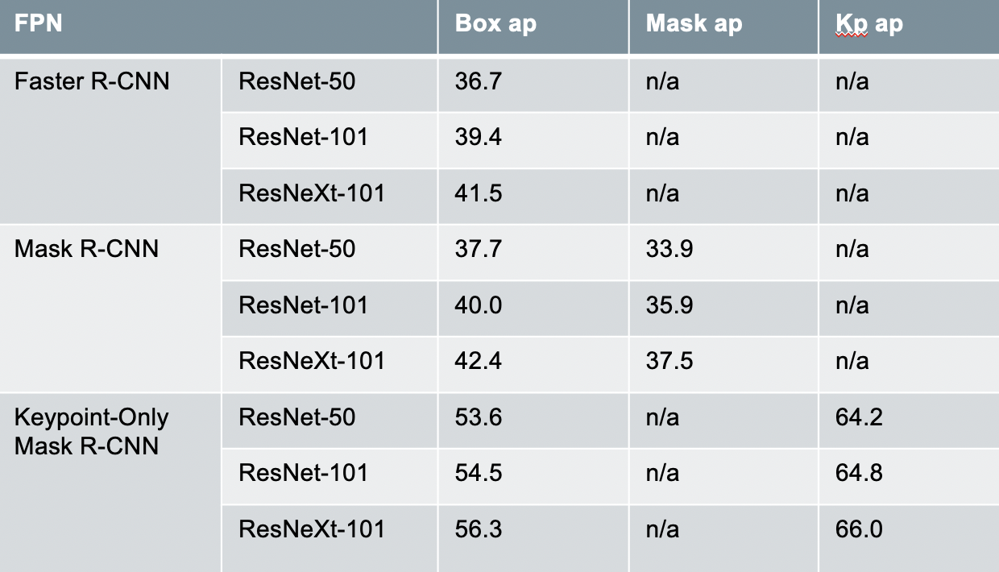

However, there is a disadvantage of Mask R-CNN in instance segmentation. Since mask is generated for each class, Mask R-CNN will do a binary classification for each pixel, which causes that the accuracy of mask will not achieve a very high value. 

# **Couclusion:**

To sum up, in this project, we
1)	Verify that Mask R-CNN has more functions than Faster R-CNN and FCN. 
2)	Verify that the ap value of Mask R-CNN is higher than those of other techiniques.
3) Display additional keypoints to make the model more robust 
4) Verify that among various backbone architectures, deeper networks perform better.

# **Reference:**
1. https://openaccess.thecvf.com/content_ICCV_2017/papers/He_Mask_R-CNN_ICCV_2017_paper.pdf
2. https://github.com/facebookresearch/Detectron
3. https://github.com/facebookresearch/Detectron/blob/master/MODEL_ZOO.md
4. https://wiki.ubc.ca/CNNs_in_Image_Segmentation
5. https://ronjian.github.io/blog/2018/05/16/Understand-Mask-RCNN
6. http://blog.csdn.net/xiaomengtingtao
7. https://www.techleer.com/articles/7.528-mask-r-cnn-mask-r-cnn-for-object-detection-and-instance-segmentation-on-keras-and-tensorflow/
8. https://towardsdatascience.com/understanding-region-of-interest-part-2-roi-align-and-roi-warp-f795196fc193?gi=9d08da97ecd6


